# Micro Credit Defaulter Project

## Problem Statement:

A Microfinance Institution (MFI) is an organization that offers financial services to low income populations. MFS becomes very useful when targeting especially the unbanked poor families living in remote areas with not much sources of income. The Microfinance services (MFS) provided by MFI are Group Loans, Agricultural Loans, Individual Business Loans and so on. 

Many microfinance institutions (MFI), experts and donors are supporting the idea of using mobile financial services (MFS) which they feel are more convenient and efficient, and cost saving, than the traditional high-touch model used since long for the purpose of delivering microfinance services. Though, the MFI industry is primarily focusing on low income families and are very useful in such areas, the implementation of MFS has been uneven with both significant challenges and successes.

Today, microfinance is widely accepted as a poverty-reduction tool, representing $70 billion in outstanding loans and a global outreach of 200 million clients.
We are working with one such client that is in Telecom Industry. They are a fixed wireless telecommunications network provider. They have launched various products and have developed its business and organization based on the budget operator model, offering better products at Lower Prices to all value conscious customers through a strategy of disruptive innovation that focuses on the subscriber. 

They understand the importance of communication and how it affects a person’s life, thus, focusing on providing their services and products to low income families and poor customers that can help them in the need of hour. 

They are collaborating with an MFI to provide micro-credit on mobile balances to be paid back in 5 days. The Consumer is believed to be defaulter if he deviates from the path of paying back the loaned amount within the time duration of 5 days. For the loan amount of 5 (in Indonesian Rupiah), payback amount should be 6 (in Indonesian Rupiah), while, for the loan amount of 10 (in Indonesian Rupiah), the payback amount should be 12 (in Indonesian Rupiah).

**Exercise:**

**The sample data is provided to us from our client database. It is hereby given for this exercise. In order to improve the selection of customers for the credit, the client wants some predictions that could help them in further investment and improvement in selection of customers.**


## Points to Remember:

• There are no null values in the dataset.

• There may be some customers with no loan history. 

• The dataset is imbalanced. Label ‘1’ has approximately 87.5% records, while, label ‘0’ has approximately 12.5% records.

• For some features, there may be values which might not be realistic. You may have to observe them and treat them with a suitable explanation.

• You might come across outliers in some features which you need to handle as per your understanding. Keep in mind that data is expensive and we cannot lose more than 7-8% of the data.  


## Features information:

- label : Flag indicating whether the user paid back the credit amount within 5 days of issuing the loan{1:success, 0:failure}
- msisdn : mobile number of user
- aon : age on cellular network in days
- daily_decr30 : Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah)
- daily_decr90 : Daily amount spent from main account, averaged over last 90 days (in Indonesian Rupiah)
- rental30 : Average main account balance over last 30 days
- rental90 : Average main account balance over last 90 days
- last_rech_date_ma : Number of days till last recharge of main account
- last_rech_date_da: Number of days till last recharge of data account
- last_rech_amt_ma : Amount of last recharge of main account (in Indonesian Rupiah)
- cnt_ma_rech30 : Number of times main account got recharged in last 30 days
- fr_ma_rech30 : Frequency of main account recharged in last 30 days
- sumamnt_ma_rech30 : Total amount of recharge in main account over last 30 days (in Indonesian Rupiah)
- medianamnt_ma_rech30 : Median of amount of recharges done in main account over last 30 days at user level (in Indonesian Rupiah)
- medianmarechprebal30 : Median of main account balance just before recharge in last 30 days at user level (in Indonesian Rupiah)
- cnt_ma_rech90 : Number of times main account got recharged in last 90 days
- fr_ma_rech90 : Frequency of main account recharged in last 90 days
- sumamnt_ma_rech90 : Total amount of recharge in main account over last 90 days (in Indonasian Rupiah)
- medianamnt_ma_rech90 : Median of amount of recharges done in main account over last 90 days at user level (in Indonasian Rupiah)
- medianmarechprebal90 : Median of main account balance just before recharge in last 90 days at user level (in Indonasian Rupiah)
- cnt_da_rech30 : Number of times data account got recharged in last 30 days
- fr_da_rech30: Frequency of data account recharged in last 30 days
- cnt_da_rech90 : Number of times data account got recharged in last 90 days
- fr_da_rech90 : Frequency of data account recharged in last 90 days
- cnt_loans30 : Number of loans taken by user in last 30 days
- amnt_loans30: Total amount of loans taken by user in last 30 days
- maxamnt_loans30 : maximum amount of loan taken by the user in last 30 days
- medianamnt_loans30 : Median of amounts of loan taken by the user in last 30 days
- cnt_loans90 : Number of loans taken by user in last 90 days
- amnt_loans90 : Total amount of loans taken by user in last 90 days
- maxamnt_loans90 : maximum amount of loan taken by the user in last 90 days
- medianamnt_loans90 : Median of amounts of loan taken by the user in last 90 days
- payback30 : Average payback time in days over last 30 days
- payback90 : Average payback time in days over last 90 days
- pcircle : telecom circle
- pdate : date

## Importoing Important Libraries

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score as cvs
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_curve , auc
from sklearn.metrics import roc_auc_score
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
import pickle
from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings('ignore')

## Loading the Dataset

In [2]:
df_micro = pd.read_csv("Data File.csv")
df_micro

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,...,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,...,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,...,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,...,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,...,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,...,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209588,209589,1,22758I85348,404.0,151.872333,151.872333,1089.19,1089.19,1.0,0.0,...,6.0,0.0,2.0,12,6,0.0,1.000000,1.000000,UPW,2016-06-17
209589,209590,1,95583I84455,1075.0,36.936000,36.936000,1728.36,1728.36,4.0,0.0,...,6.0,0.0,3.0,18,6,0.0,1.000000,1.000000,UPW,2016-06-12
209590,209591,1,28556I85350,1013.0,11843.111667,11904.350000,5861.83,8893.20,3.0,0.0,...,12.0,0.0,6.0,54,12,0.0,4.000000,3.833333,UPW,2016-07-29
209591,209592,1,59712I82733,1732.0,12488.228333,12574.370000,411.83,984.58,2.0,38.0,...,12.0,0.0,3.0,24,12,0.0,0.000000,10.500000,UPW,2016-07-25


In [4]:
df_micro.head()

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,...,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,...,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,...,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,...,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,...,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,...,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22


In [5]:
pd.set_option('display.max_columns', None) # show all columns in a dataframe
pd.set_option('display.max_rows', None) # show all rows in a dataframe

In [6]:
df_micro.head()

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22


In [7]:
df_micro.sample(10)

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
68364,68365,0,94315I90848,345.000000,1.420000,1.420,526.70,526.70,0.0,0.0,0,0,0.0,0.0,0.0,0.00,0,0,0,0.0,0.00,0.0,0.000000,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-06-05
149236,149237,1,40983I90580,932690.684451,35.664000,35.664,1028.00,1028.00,3.0,0.0,1547,2,8.0,5014.0,2507.0,2.00,2,8,5014,2507.0,2.00,0.0,0.000000,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-06-08
151662,151663,1,49833I90847,594.000000,17891.058333,17906.670,8250.70,9157.30,1.0,0.0,3178,7,1.0,27939.0,3178.0,209.00,7,1,27939,3178.0,209.00,0.0,572279.142798,0,0,2,12,6.0,0.0,2.0,12,6,0.0,22.000000,22.000000,UPW,2016-07-05
126135,126136,1,21950I85339,507.000000,362.632000,362.632,-426.96,-426.96,1.0,0.0,1547,16,1.0,15809.0,773.0,103.50,17,1,17356,773.0,102.00,0.0,0.000000,0,0,10,60,6.0,0.0,10.0,60,6,0.0,2.111111,2.111111,UPW,2016-06-24
144209,144210,1,45254I91197,277.000000,12.240000,12.240,419.20,419.20,-28.0,0.0,770,1,0.0,770.0,770.0,7.20,3,0,3264,947.0,29.20,0.0,0.000000,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-06-05
39345,39346,1,34663I85338,1463.000000,4830.960000,4858.800,302.59,415.98,2.0,0.0,770,3,2.0,2310.0,770.0,74.10,10,2,6518,770.0,87.10,0.0,0.000000,0,0,3,18,6.0,0.0,7.0,42,6,0.0,8.666667,8.166667,UPW,2016-07-29
24478,24479,1,52646I70377,667.000000,564.900000,567.000,3613.28,3708.41,12.0,0.0,770,1,0.0,770.0,770.0,2.00,1,0,770,770.0,2.00,0.0,0.000000,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-07-09
8241,8242,1,64105I88649,1444.000000,3509.373333,3526.200,785.65,875.73,3.0,0.0,1539,8,4.0,10023.0,1156.0,32.08,9,4,13490,1539.0,31.58,0.0,0.000000,0,0,7,42,6.0,0.0,9.0,54,6,0.0,3.142857,3.125000,UPW,2016-07-04
145817,145818,1,49768I84458,1018.000000,78.168000,78.168,-34.72,-34.72,44.0,0.0,7400,0,0.0,0.0,0.0,0.00,1,0,7400,7400.0,12.68,0.0,0.000000,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-06-08
94652,94653,1,75859I70377,430.000000,173.616000,173.616,-428.64,-428.64,8.0,0.0,8000,1,0.0,8000.0,8000.0,8.60,1,0,8000,8000.0,8.60,0.0,0.000000,0,0,2,12,6.0,0.0,2.0,12,6,0.0,4.500000,4.500000,UPW,2016-06-24


In [8]:
df_micro.shape

(209593, 37)

There are 209593 rows and 37 columns in the given dataset.

In [9]:
df_micro.dtypes

Unnamed: 0                int64
label                     int64
msisdn                   object
aon                     float64
daily_decr30            float64
daily_decr90            float64
rental30                float64
rental90                float64
last_rech_date_ma       float64
last_rech_date_da       float64
last_rech_amt_ma          int64
cnt_ma_rech30             int64
fr_ma_rech30            float64
sumamnt_ma_rech30       float64
medianamnt_ma_rech30    float64
medianmarechprebal30    float64
cnt_ma_rech90             int64
fr_ma_rech90              int64
sumamnt_ma_rech90         int64
medianamnt_ma_rech90    float64
medianmarechprebal90    float64
cnt_da_rech30           float64
fr_da_rech30            float64
cnt_da_rech90             int64
fr_da_rech90              int64
cnt_loans30               int64
amnt_loans30              int64
maxamnt_loans30         float64
medianamnt_loans30      float64
cnt_loans90             float64
amnt_loans90              int64
maxamnt_

It gives us the data type of each column. The target variable of the given dataset is of integer datatype

## Preprocessing and EDA:

In [10]:
df_micro.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 37 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            209593 non-null  int64  
 1   label                 209593 non-null  int64  
 2   msisdn                209593 non-null  object 
 3   aon                   209593 non-null  float64
 4   daily_decr30          209593 non-null  float64
 5   daily_decr90          209593 non-null  float64
 6   rental30              209593 non-null  float64
 7   rental90              209593 non-null  float64
 8   last_rech_date_ma     209593 non-null  float64
 9   last_rech_date_da     209593 non-null  float64
 10  last_rech_amt_ma      209593 non-null  int64  
 11  cnt_ma_rech30         209593 non-null  int64  
 12  fr_ma_rech30          209593 non-null  float64
 13  sumamnt_ma_rech30     209593 non-null  float64
 14  medianamnt_ma_rech30  209593 non-null  float64
 15  

It gives us the Name of columns with its non-null value counts , it's datatype , index number and memory usage. There are 21 columns with float datatypes, 12 columns with integer datatype and only 3 columns with object datatype.

In [11]:
df_micro.columns

Index(['Unnamed: 0', 'label', 'msisdn', 'aon', 'daily_decr30', 'daily_decr90',
       'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_date_da',
       'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30',
       'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30',
       'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90',
       'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_da_rech30',
       'fr_da_rech30', 'cnt_da_rech90', 'fr_da_rech90', 'cnt_loans30',
       'amnt_loans30', 'maxamnt_loans30', 'medianamnt_loans30', 'cnt_loans90',
       'amnt_loans90', 'maxamnt_loans90', 'medianamnt_loans90', 'payback30',
       'payback90', 'pcircle', 'pdate'],
      dtype='object')

In [12]:
#Checking unique values of each column
df_micro.nunique()

Unnamed: 0              209593
label                        2
msisdn                  186243
aon                       4507
daily_decr30            147025
daily_decr90            158669
rental30                132148
rental90                141033
last_rech_date_ma         1186
last_rech_date_da         1174
last_rech_amt_ma            70
cnt_ma_rech30               71
fr_ma_rech30              1083
sumamnt_ma_rech30        15141
medianamnt_ma_rech30       510
medianmarechprebal30     30428
cnt_ma_rech90              110
fr_ma_rech90                89
sumamnt_ma_rech90        31771
medianamnt_ma_rech90       608
medianmarechprebal90     29785
cnt_da_rech30             1066
fr_da_rech30              1072
cnt_da_rech90               27
fr_da_rech90                46
cnt_loans30                 40
amnt_loans30                48
maxamnt_loans30           1050
medianamnt_loans30           6
cnt_loans90               1110
amnt_loans90                69
maxamnt_loans90              3
medianam

And pcircle has only one entry throughout so it will have no contribution with our model training we can drop this column also. Also msisdn is a column with phone numbers of users so this column has no contribution on model building.

In [13]:
#checking if there are any null values present in the dataset
df_micro.isnull().sum()

Unnamed: 0              0
label                   0
msisdn                  0
aon                     0
daily_decr30            0
daily_decr90            0
rental30                0
rental90                0
last_rech_date_ma       0
last_rech_date_da       0
last_rech_amt_ma        0
cnt_ma_rech30           0
fr_ma_rech30            0
sumamnt_ma_rech30       0
medianamnt_ma_rech30    0
medianmarechprebal30    0
cnt_ma_rech90           0
fr_ma_rech90            0
sumamnt_ma_rech90       0
medianamnt_ma_rech90    0
medianmarechprebal90    0
cnt_da_rech30           0
fr_da_rech30            0
cnt_da_rech90           0
fr_da_rech90            0
cnt_loans30             0
amnt_loans30            0
maxamnt_loans30         0
medianamnt_loans30      0
cnt_loans90             0
amnt_loans90            0
maxamnt_loans90         0
medianamnt_loans90      0
payback30               0
payback90               0
pcircle                 0
pdate                   0
dtype: int64

<AxesSubplot:>

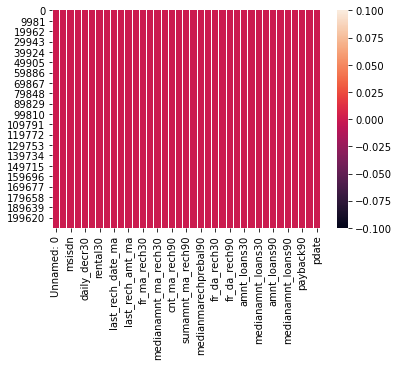

In [14]:
sns.heatmap(df_micro.isnull())

As mentioned earlier, there is no missing value in the dataset.

In [15]:
df_micro.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,209593.0,104797.000000,60504.431823,1.000000,52399.000,104797.000000,157195.00,209593.000000
label,209593.0,0.875177,0.330519,0.000000,1.000,1.000000,1.00,1.000000
aon,209593.0,8112.343445,75696.082531,-48.000000,246.000,527.000000,982.00,999860.755168
daily_decr30,209593.0,5381.402289,9220.623400,-93.012667,42.440,1469.175667,7244.00,265926.000000
daily_decr90,209593.0,6082.515068,10918.812767,-93.012667,42.692,1500.000000,7802.79,320630.000000
rental30,209593.0,2692.581910,4308.586781,-23737.140000,280.420,1083.570000,3356.94,198926.110000
rental90,209593.0,3483.406534,5770.461279,-24720.580000,300.260,1334.000000,4201.79,200148.110000
last_rech_date_ma,209593.0,3755.847800,53905.892230,-29.000000,1.000,3.000000,7.00,998650.377733
last_rech_date_da,209593.0,3712.202921,53374.833430,-29.000000,0.000,0.000000,0.00,999171.809410
last_rech_amt_ma,209593.0,2064.452797,2370.786034,0.000000,770.000,1539.000000,2309.00,55000.000000


In [17]:
#let us have brief understanding of unique values present in the dataset.
for i in df_micro.columns:
    print('Name of attribute:',i,'\n',df_micro[i].value_counts())
    print('*'*80)

Name of attribute: Unnamed: 0 
 1         1
139733    1
139723    1
139724    1
139725    1
139726    1
139727    1
139728    1
139729    1
139730    1
139731    1
139732    1
139734    1
139721    1
139735    1
139736    1
139737    1
139738    1
139739    1
139740    1
139741    1
139742    1
139743    1
139744    1
139722    1
139720    1
139797    1
139707    1
139697    1
139698    1
139699    1
139700    1
139701    1
139702    1
139703    1
139704    1
139705    1
139706    1
139708    1
139719    1
139709    1
139710    1
139711    1
139712    1
139713    1
139714    1
139715    1
139716    1
139717    1
139718    1
139745    1
139746    1
139747    1
139784    1
139774    1
139775    1
139776    1
139777    1
139778    1
139779    1
139780    1
139781    1
139782    1
139783    1
139785    1
139748    1
139786    1
139787    1
139788    1
139789    1
139790    1
139791    1
139792    1
139793    1
139794    1
139795    1
139773    1
139772    1
139771    1
139770    1
139749  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 95.000000        392
 92.000000        362
 96.000000        357
 99.000000        356
 157.000000       349
 94.000000        348
 130.000000       346
 108.000000       346
 93.000000        340
 98.000000        339
 133.000000       338
 104.000000       337
 101.000000       333
 102.000000       333
 156.000000       332
 144.000000       330
 103.000000       329
 119.000000       329
 131.000000       327
 107.000000       327
 169.000000       327
 126.000000       326
 137.000000       325
 117.000000       325
 136.000000       324
 146.000000       323
 113.000000       323
 159.000000       323
 97.000000        322
 145.000000       322
 100.000000       322
 147.000000       320
 118.000000       320
 110.000000       319
 106.000000       318
 120.000000       318
 183.000000       318
 134.000000       317
 112.000000       317
 124.000000       316
 122.000000       316
 123.000000       314
 143.000000       314
 154.000000       312
 150.000000       311
 128.00000

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0.000000         78683
1.000000         22370
2.000000         18849
3.000000         14306
4.000000         11194
5.000000          8982
6.000000          7785
7.000000          6908
8.000000          6116
9.000000          5100
10.000000         4261
11.000000         3583
12.000000         3043
13.000000         2693
14.000000         2280
15.000000         1990
16.000000         1604
17.000000         1438
18.000000         1242
19.000000         1023
20.000000          854
21.000000          781
22.000000          697
23.000000          546
24.000000          470
25.000000          364
26.000000          351
27.000000          252
28.000000          204
29.000000          159
35.000000           89
36.000000           82
34.000000           68
30.000000           64
37.000000           58
38.000000           57
846099.632210        1
670963.070472        1
921604.767442        1
956859.409111        1
653794.268728        1
624309.928739        1
871851.355187        1
752698.8738

Observations:
1. There are 209593 rows and 37 columns in the data sets which have different information in each attribute. There are no null values.
2. Basically there are 2 type of observations made i.e, customer behavior for 30 days and 90 days.
Two types of account held by customer main account, data account.
3. Target feature 'Label' has unbalanced data, we need to treat the target variable using sampling technique.
3. 'Unnamed: 0' attribute has all unique values as same as index columns which has no importance for analysis.
4. Approximately 90% of data in 'msisdn' has unique values, i.e, ID.
5. 'payback30','payback90' has nearly 50% of the values having 0.
6. More than 90% of 'last_rech_date_da', 'cnt_da_rech90 ','fr_da_rech90','medianamnt_loans30','medianamnt_loans90' has of values which is 0.
7. 'pcircle' has only 1 unique value through out column and 'pdate' is a categorical column we can drop this column.

In [18]:
#Droping Unnamed: 0,msisdn and pcircle column
df_micro.drop(columns=['Unnamed: 0','pcircle','msisdn'], inplace=True, axis=1)

In [19]:
#Since 'date' is object data type also not much info is given about what date it is. So dropping date column
df_micro.drop(columns=['pdate'], inplace=True, axis=1)

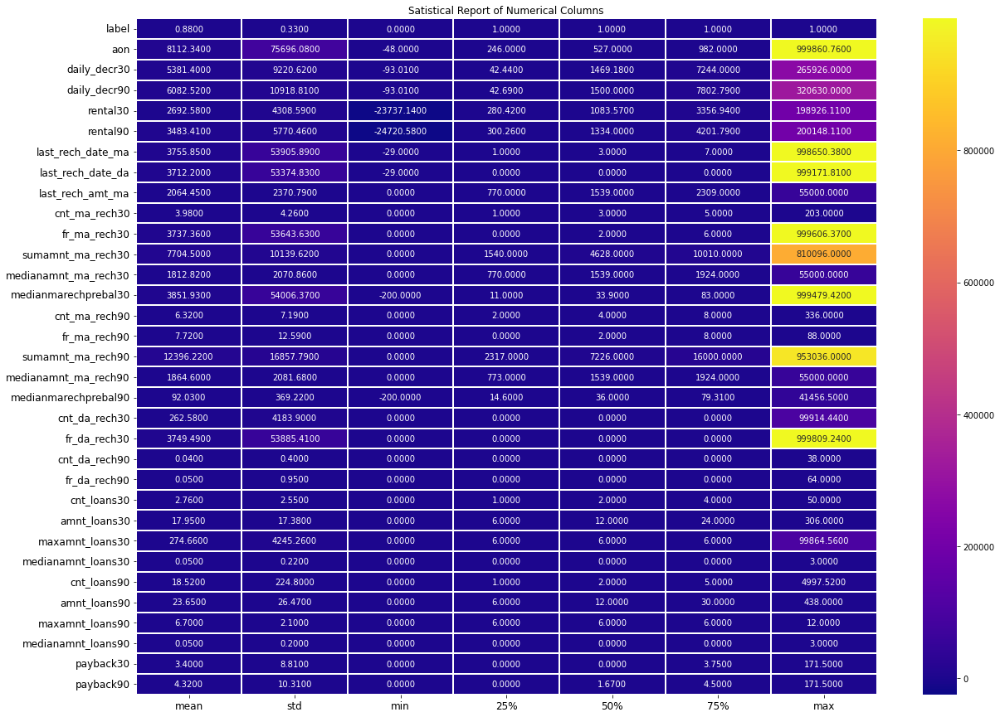

In [20]:
# visualizing the statistical description of numeric datatype columns

plt.figure(figsize = (20,15))
sns.heatmap(round(df_micro.describe()[1:].transpose(),2), linewidth = 2, annot= True, fmt = ".4f", cmap="plasma")
plt.title("Satistical Report of Numerical Columns")
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.show()

In the above report we can see that the maximum value for columns aon, daily_decr30, daily_decr90, rental30, rental90, last_rech_date_ma, last_rech_date_da, fr_ma_rech30, sumamnt_ma_rech30, medianmarechprebal30, sumamnt_ma_rech90 and fr_da_rech30 have quite a high number than the other column values.

In [21]:
#Checking the value counts of last_rech_date_da column
df_micro.last_rech_date_da.value_counts()

 0.000000         202861
 7.000000            163
 8.000000            160
 11.000000           149
 13.000000           148
 12.000000           147
 17.000000           123
 10.000000           122
 16.000000           121
 9.000000            120
 14.000000           114
 18.000000           113
 25.000000           107
 1.000000            105
 19.000000           105
 20.000000           104
 15.000000           102
 24.000000           102
 34.000000           100
 38.000000            99
 27.000000            96
 23.000000            96
 22.000000            91
 21.000000            91
 29.000000            90
 37.000000            89
 33.000000            83
 35.000000            83
 39.000000            81
 31.000000            80
 26.000000            80
 28.000000            77
 43.000000            77
 32.000000            74
 30.000000            73
 44.000000            71
 42.000000            67
 6.000000             63
 40.000000            61
 52.000000            54


**I have 97% zeros in this column.**

In [22]:
#Checking the value counts of cnt_da_rech30 column
df_micro.cnt_da_rech30.value_counts()

0.000000        205479
1.000000          2331
2.000000           372
3.000000           156
4.000000            86
5.000000            34
6.000000            27
7.000000            20
9.000000            12
8.000000             9
10.000000            5
11.000000            4
13.000000            3
12.000000            2
16.000000            2
86843.243516         1
38301.735125         1
82361.089303         1
74583.628476         1
26868.508793         1
49019.152438         1
87301.535743         1
56153.694289         1
27264.102268         1
76074.093652         1
7895.225810          1
44622.806152         1
64953.386125         1
70777.657782         1
14389.198553         1
40963.452408         1
11113.496217         1
98149.599533         1
29494.512441         1
24158.721763         1
54126.353703         1
26680.788160         1
12798.810841         1
56669.600838         1
16975.038283         1
59244.498321         1
52614.990468         1
55848.165083         1
50374.22234

**I have 98% zeros in this column**

In [23]:
#Checking the value counts of fr_da_rech30 column
df_micro.fr_da_rech30.value_counts()

0.000000         208014
3.000000             64
1.000000             55
2.000000             51
7.000000             47
4.000000             45
6.000000             38
5.000000             36
8.000000             34
10.000000            19
9.000000             19
11.000000            18
12.000000            16
14.000000            15
13.000000            15
15.000000            13
18.000000            11
16.000000             9
19.000000             8
17.000000             6
20.000000             6
23.000000             2
21.000000             2
22.000000             2
561988.600180         1
643392.049475         1
710594.108677         1
670794.027857         1
947243.000614         1
931951.525738         1
946195.436874         1
950149.553129         1
904288.911261         1
926591.018098         1
551754.996181         1
765588.314389         1
799915.021285         1
738055.326743         1
749703.690875         1
706403.870136         1
992813.996039         1
526991.956751   

**I have 99% zeros in this column.**

In [24]:
#Checking the value counts of cnt_da_rech90 column
df_micro.cnt_da_rech90.value_counts()

0     204226
1       4173
2        556
3        227
4        150
5         74
6         49
7         36
8         30
9         18
14        10
12         7
11         7
13         6
10         6
16         4
18         3
15         2
20         1
25         1
28         1
30         1
22         1
38         1
19         1
27         1
17         1
Name: cnt_da_rech90, dtype: int64

**I have 97% zeros in this column.**

In [25]:
#Checking the value counts of fr_da_rech90 column
df_micro.fr_da_rech90.value_counts()

0     208728
3         78
1         66
2         66
4         56
7         55
6         52
5         45
8         44
10        33
14        32
9         32
11        30
12        27
19        22
28        19
15        17
13        17
18        16
29        15
16        14
17        14
25        11
22        11
21        10
20         9
32         8
24         8
27         8
26         7
30         7
31         6
34         5
37         5
23         5
57         3
35         2
41         2
42         1
39         1
33         1
43         1
56         1
46         1
55         1
64         1
Name: fr_da_rech90, dtype: int64

**I have 99% zeros in this column.**

In [26]:
#Checking the value counts of medianamnt_loans30 column
df_micro.medianamnt_loans30.value_counts()

0.0    195445
1.0      7149
0.5      6538
2.0       420
1.5        38
3.0         3
Name: medianamnt_loans30, dtype: int64

**I have 93% zeros in this column.**

In [27]:
#Checking the value counts of medianamnt_loans90 column
df_micro.medianamnt_loans90.value_counts()

0.0    197424
1.0      6172
0.5      5668
2.0       307
1.5        19
3.0         3
Name: medianamnt_loans90, dtype: int64

**I have 94% zeros in this column.**

In all the above columns i found more than 90% zeros so they will create skewness in our dataset. So we have to drop these columns. {I have also looked into the valuecounts of other columns and they looked perfect, but i have removed there coding and output due to space problem.}

In [28]:
#Droping columns with more than 90% zeros
df_micro.drop(columns = ['last_rech_date_da','cnt_da_rech30','fr_da_rech30','cnt_da_rech90','fr_da_rech90','medianamnt_loans30','medianamnt_loans90'],inplace = True)

In [29]:
#Checking description of data set
df_micro.describe()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90
count,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000
mean,0.875177,8112.343445,5381.402289,6082.515068,2692.581910,3483.406534,3755.847800,2064.452797,3.978057,3737.355121,7704.501157,1812.817952,3851.927942,6.31543,7.716780,12396.218352,1864.595821,92.025541,2.758981,17.952021,274.658747,18.520919,23.645398,6.703134,3.398826,4.321485
std,0.330519,75696.082531,9220.623400,10918.812767,4308.586781,5770.461279,53905.892230,2370.786034,4.256090,53643.625172,10139.621714,2070.864620,54006.374433,7.19347,12.590251,16857.793882,2081.680664,369.215658,2.554502,17.379741,4245.264648,224.797423,26.469861,2.103864,8.813729,10.308108
min,0.000000,-48.000000,-93.012667,-93.012667,-23737.140000,-24720.580000,-29.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-200.000000,0.00000,0.000000,0.000000,0.000000,-200.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,246.000000,42.440000,42.692000,280.420000,300.260000,1.000000,770.000000,1.000000,0.000000,1540.000000,770.000000,11.000000,2.00000,0.000000,2317.000000,773.000000,14.600000,1.000000,6.000000,6.000000,1.000000,6.000000,6.000000,0.000000,0.000000
50%,1.000000,527.000000,1469.175667,1500.000000,1083.570000,1334.000000,3.000000,1539.000000,3.000000,2.000000,4628.000000,1539.000000,33.900000,4.00000,2.000000,7226.000000,1539.000000,36.000000,2.000000,12.000000,6.000000,2.000000,12.000000,6.000000,0.000000,1.666667
75%,1.000000,982.000000,7244.000000,7802.790000,3356.940000,4201.790000,7.000000,2309.000000,5.000000,6.000000,10010.000000,1924.000000,83.000000,8.00000,8.000000,16000.000000,1924.000000,79.310000,4.000000,24.000000,6.000000,5.000000,30.000000,6.000000,3.750000,4.500000
max,1.000000,999860.755168,265926.000000,320630.000000,198926.110000,200148.110000,998650.377733,55000.000000,203.000000,999606.368132,810096.000000,55000.000000,999479.419319,336.00000,88.000000,953036.000000,55000.000000,41456.500000,50.000000,306.000000,99864.560864,4997.517944,438.000000,12.000000,171.500000,171.500000


I can observe negative values in some columns

aon : age on cellular network in days

daily_decr30 : Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah)

daily_decr90 : Daily amount spent from main account, averaged over last 90 days (in Indonesian Rupiah)

rental30 : Average main account balance over last 30 days

rental90 : Average main account balance over last 90 days

last_rech_date_ma : Number of days till last recharge of main account

medianmarechprebal30 : Median of main account balance just before recharge in last 30 days at user level (in Indonesian Rupiah)

medianmarechprebal90 : Median of main account balance just before recharge in last 90 days at user level (in Indonesian Rupiah)

The above columns can not be negative as they are age, account balance and number of days. So we will change them to positive.

# Vizualizations:

## Univaraiate Analysis

1    183431
0     26162
Name: label, dtype: int64

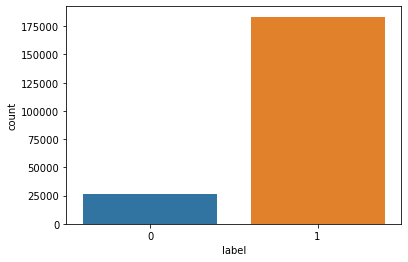

In [30]:
#Let us analyse target variable and check unique values and represent the values in form of pie chart
sns.countplot(df_micro['label'])
df_micro['label'].value_counts()

Here we can see that out of 209593, 183431 label are success which is around 87.5177% and 26162 labels are failure which is 
around 12.482%. 
Also Here we can see there is huge difference between two Categories of label. So the data is imbalanced. So we will apply SMOTE analysis before ML of final model.

**There are 87.5% of non-defaulters and 12.5% of defaulter customers, the data is unbalanced we will use random oversampling technique to balance the target.**

In [31]:
# Now checking for numerical columns
numerical_columns=[]
for i in df_micro.dtypes.index:
    if df_micro.dtypes[i]!='object':
        numerical_columns.append(i)
print(numerical_columns)

['label', 'aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'cnt_loans90', 'amnt_loans90', 'maxamnt_loans90', 'payback30', 'payback90']


**Above are the list of numerical columns in the dataset.**

In [32]:
col=[ 'aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'cnt_loans90', 'amnt_loans90', 'maxamnt_loans90', 'payback30', 'payback90']

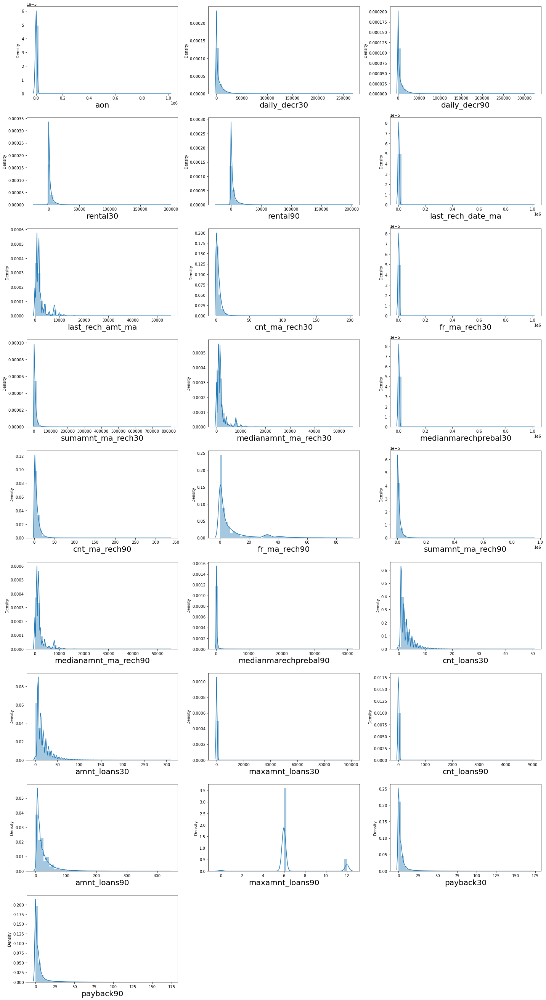

In [33]:
#Distribution plot for all numerical columns except label
plt.figure(figsize = (20,40))
plotnumber = 1
for column in df_micro[col]:
    if plotnumber <=30:
        ax = plt.subplot(10,3,plotnumber)
        sns.distplot(df_micro[column])
        plt.xlabel(column,fontsize = 20)
    plotnumber+=1
plt.tight_layout()

OBSERVATIONS:

I can clearly see that there is skewness in most of the columns so we have to treat them

## Bivariate Analysis:

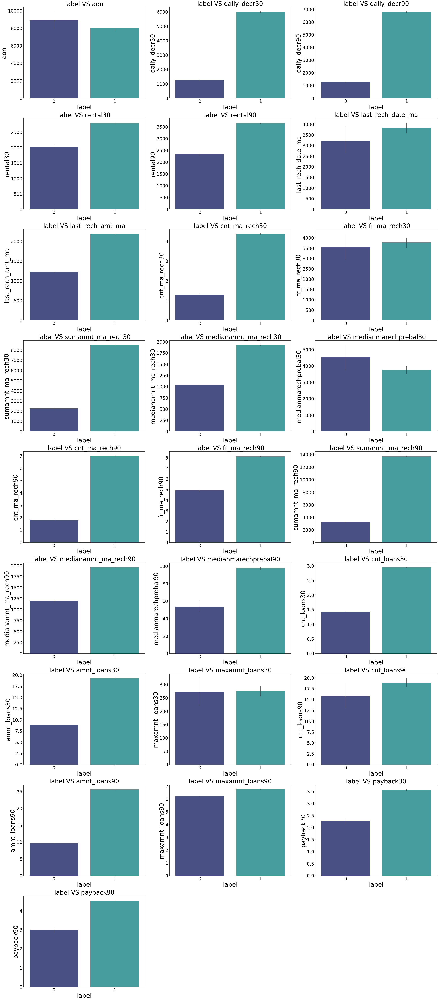

In [34]:
#barplot for numerical columns
plt.figure(figsize=(40,100))
for i in range(len(col)):
    plt.subplot(10,3,i+1)
    sns.barplot(x=df_micro['label'], y=df_micro[col[i]], palette="mako")
    plt.title(f"label VS {col[i]}",fontsize=40)
    plt.xticks(fontsize=30)  
    plt.yticks(fontsize=30)
    plt.xlabel('label',fontsize = 40)
    plt.ylabel(col[i],fontsize = 40)
    plt.tight_layout()

OBSERVATIONS:

1. Customers with high value of Age on cellular network in days(aon) are maximum defaulters(who have not paid there loan amount-0).
2. Customers with high value of Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah)(daily_decr30) are maximum Non-defaulters(who have paid there loan amount-1).
3. Customers with high value of Daily amount spent from main account, averaged over last 90 days (in Indonesian Rupiah)(daily_decr90) are maximum Non-defaulters(who have paid there loan amount-1).
4. Customers with high value of Average main account balance over last 30 days(rental30) are maximum Non-defaulters(who have paid there loan amount-1).
5. Customers with high value of Average main account balance over last 90 days(rental90) are maximum Non-defaulters(who have paid there loan amount-1).
6. Customers with high Number of days till last recharge of main account(last_rech_date_ma) are maximum Non-defaulters(who have paid there loan amount-1).
7. Customers with high value of Amount of last recharge of main account (in Indonesian Rupiah)(last_rech_amt_ma) are maximum Non-defaulters(who have paid there loan amount-1).
8. Customers with high value of Number of times main account got recharged in last 30 days(cnt_ma_rech30) are maximum Non-defaulters(who have paid there loan amount-1).
9. Customers with high value of Frequency of main account recharged in last 30 days(fr_ma_rech30) are maximum Non-defaulters(who have paid there loan amount-1) and also the count is high for defaulters comparitively Non-defaulters are more in number.
10. Customers with high value of Total amount of recharge in main account over last 30 days (in Indonesian Rupiah)(sumamnt_ma_rech30) are maximum Non-defaulters(who have paid there loan amount-1).
11. Customers with high value of Median of amount of recharges done in main account over last 30 days at user level (in Indonesian Rupiah)(medianamnt_ma_rech30) are maximum Non-defaulters(who have paid there loan amount-1).
12. Customers with high value of Median of main account balance just before recharge in last 30 days at user level (in Indonesian Rupiah)(medianmarechprebal30) are maximum defaulters(who have not paid there loan amount-0).
13. Customers with high value of Number of times main account got recharged in last 90 days(cnt_ma_rech90) are maximum Non-defaulters(who have paid there loan amount-1).
14. Customers with high value of Frequency of main account recharged in last 90 days(fr_ma_rech90) are maximum Non-defaulters(who have paid there loan amount-1).
15. Customers with high value of Total amount of recharge in main account over last 90 days (in Indonasian Rupiah)(sumamnt_ma_rech90) are maximum Non-defaulters(who have paid there loan amount-1).
16. Customers with high value of Median of amount of recharges done in main account over last 90 days at user level (in Indonasian Rupiah)(medianamnt_ma_rech90) are maximum Non-defaulters(who have paid there loan amount-1).
17. Customers with high value of Median of main account balance just before recharge in last 90 days at user level (in Indonasian Rupiah)(medianmarechprebal90) are maximum Non-defaulters(who have paid there loan amount-1).
18. Customers with high value of Number of loans taken by user in last 30 days(cnt_loans30) are maximum Non-defaulters(who have paid there loan amount-1).
19. Customers with high value of Total amount of loans taken by user in last 30 days(amnt_loans30) are maximum Non-defaulters(who have paid there loan amount-1).
20. Customers with high value of maximum amount of loan taken by the user in last 30 days(maxamnt_loans30) are maximum Non-defaulters(who have paid there loan amount-1).
21. Customers with high value of Number of loans taken by user in last 90 days(cnt_loans90) are maximum Non-defaulters(who have paid there loan amount-1).
22. Customers with high value of Total amount of loans taken by user in last 90 days(amnt_loans90) are maximum Non-defaulters(who have paid there loan amount-1).
23. Customers with high value of maximum amount of loan taken by the user in last 90 days(maxamnt_loans90) are maximum Non-defaulters(who have paid there loan amount-1).
24. Customers with high value of Average payback time in days over last 30 days(payback30) are maximum Non-defaulters(who have paid there loan amount-1).
25. Customers with high value of Average payback time in days over last 90 days(payback90) are maximum Non-defaulters(who have paid there loan amount-1).
26. In between 6th and 7th month maximum customers both defualters and Non-defaulters have paid there loan amount.
27. Below 14th of each month all the customers have paid there loan amount.

## Checking for outliers:

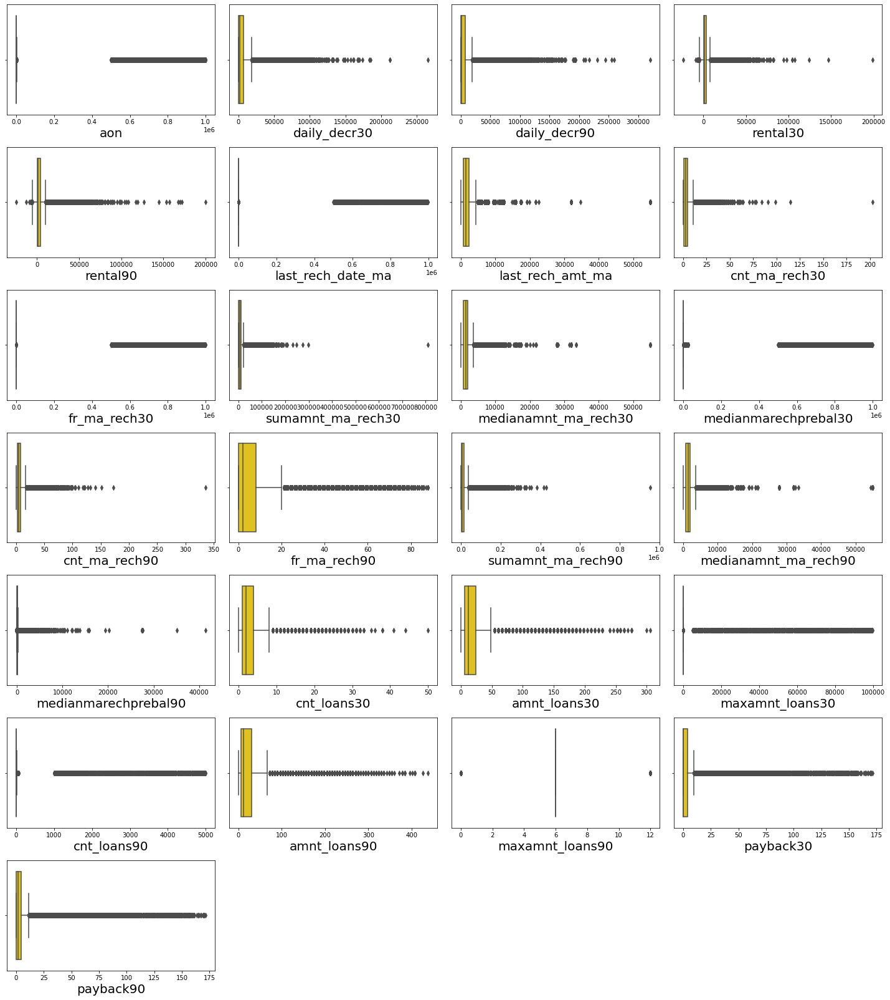

In [35]:
# Identifying the outliers using boxplot

plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for column in col:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.boxplot(df_micro[column],color='gold')
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

There are outliers in almost all the columns.

## Removing Outliers:

### i) Zscore method:

In [36]:
#Features having outliers 
features=df_micro[['aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'cnt_loans90', 'amnt_loans90', 'maxamnt_loans90', 'payback30', 'payback90']]

Above are the list of columns with outliers in the dataset.

In [37]:
from scipy.stats import zscore
z=np.abs(zscore(features))
df_new=df_micro[(z<3).all(axis=1)]
df_new.head()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90
0,0,272.0,3055.050000,3065.150000,220.13,260.13,2.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,2,12,6.0,2.0,12,6,29.000000,29.000000
1,1,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,1,12,12.0,1.0,12,12,0.000000,0.000000
2,1,535.0,1398.000000,1398.000000,900.13,900.13,3.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,1,6,6.0,1.0,6,6,0.000000,0.000000
3,1,241.0,21.228000,21.228000,159.42,159.42,41.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,2,12,6.0,2.0,12,6,0.000000,0.000000
4,1,947.0,150.619333,150.619333,1098.90,1098.90,4.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,7,42,6.0,7.0,42,6,2.333333,2.333333


In [38]:
#Checking shape of new dataset
df_new.shape

(171224, 26)

In my new dataset i have 170071 rows and 28 columns.

In [39]:
#Checking shape of old dataset
df_micro.shape

(209593, 26)

In my old dataset i have 207550 rows and 28 columns.

In [40]:
#Checking dataloss in zscore method
Dataloss = (((209593-171224)/209593)*100)
Dataloss

18.306431989617973

In Z-score method the data loss is more than 10% so let me have a look into IQR method to remove outliers.

### ii) IQR method:

In [41]:
# 1st quantile
Q1=features.quantile(0.25)

# 3rd quantile
Q3=features.quantile(0.75)

# IQR
IQR=Q3 - Q1

df_1=df_micro[~((df_micro < (Q1 - 1.5 * IQR)) |(df_micro > (Q3 + 1.5 * IQR))).any(axis=1)]

In [42]:
#Checking shape of new dataset
df_1.shape

(77450, 26)

In [43]:
#Checking shape of old dataset
df_micro.shape

(209593, 26)

In [44]:
#Checking dataloss in IQR method of the dataset
Dataloss = (((209593-77450)/209593)*100)
Dataloss

63.04743001913232

In IQR method the data loss is more than 10% so let me have a look into percentile method to remove outliers.

### iii) Percentile Method:

In [45]:
#Removing outliers using percentile method
for colu in features:
    if df_micro[colu].dtypes != 'object':
        percentile = df_micro[colu].quantile([0.01,0.98]).values
        df_micro[colu][df_micro[colu]<=percentile[0]]=percentile[0]
        df_micro[colu][df_micro[colu]>=percentile[1]]=percentile[1]

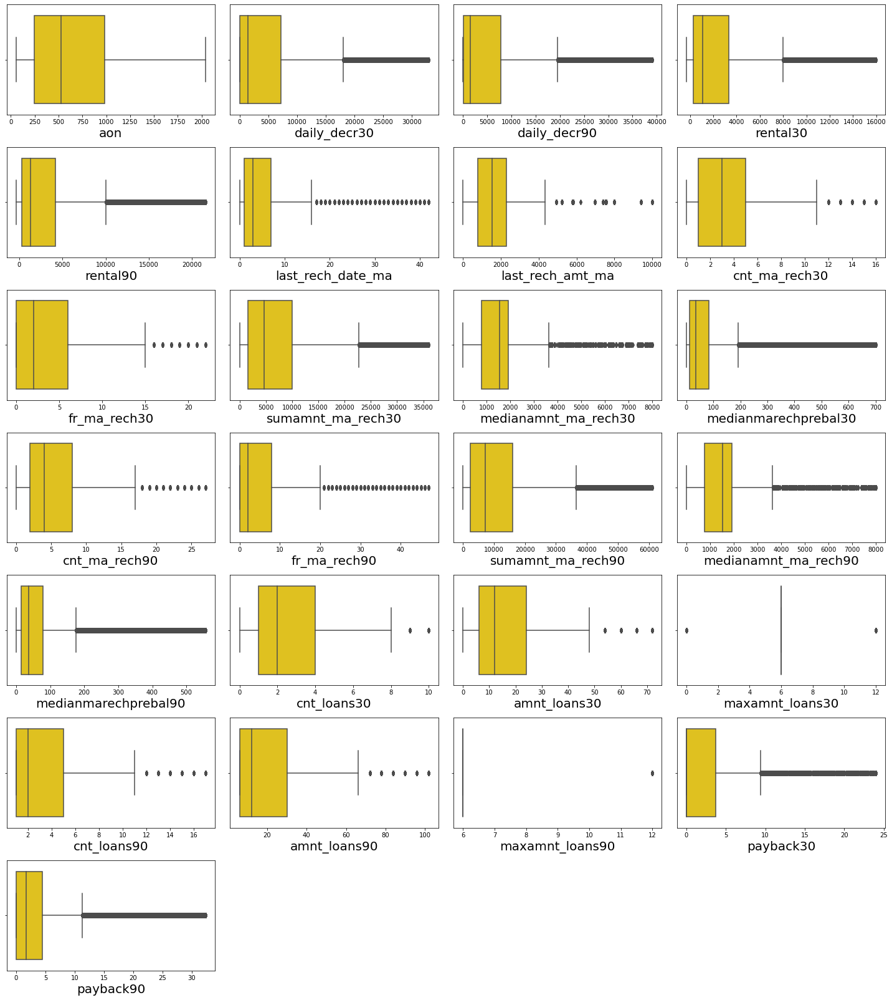

In [46]:
# Checking if the outliers is reduced or not

plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for column in col:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.boxplot(df_micro[column],color='gold')
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

Outliers has reduced in all the columns.

## Check for skewness

In [47]:
#cheking the skewness present in the dataset
df_micro.skew()

label                  -2.270254
aon                     0.935197
daily_decr30            1.974394
daily_decr90            2.091659
rental30                2.106223
rental90                2.194864
last_rech_date_ma       2.615836
last_rech_amt_ma        2.080016
cnt_ma_rech30           1.415594
fr_ma_rech30            1.703205
sumamnt_ma_rech30       1.750999
medianamnt_ma_rech30    2.115971
medianmarechprebal30    2.830858
cnt_ma_rech90           1.569282
fr_ma_rech90            1.985638
sumamnt_ma_rech90       1.863547
medianamnt_ma_rech90    2.133303
medianmarechprebal90    2.666638
cnt_loans30             1.576547
amnt_loans30            1.733837
maxamnt_loans30         1.405285
cnt_loans90             1.923139
amnt_loans90            1.840032
maxamnt_loans90         2.241299
payback30               2.648819
payback90               2.829305
dtype: float64

There is skewness in almost all columns​.

### Removing skewness using yeo-johnson method:

In [48]:
#Creating a list of skewed features
fea=['aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'cnt_loans90', 'amnt_loans90', 'maxamnt_loans90', 'payback30', 'payback90']

In [49]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box_cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box_cox' or 'yeo-johnson'\n"

In [50]:
df_micro[fea] = scaler.fit_transform(df_micro[fea].values)

In [51]:
#Checking skewness again
df_micro[fea].skew()

aon                    -0.059160
daily_decr30           -0.143090
daily_decr90           -0.132714
rental30                0.720837
rental90                0.757030
last_rech_date_ma       0.043786
last_rech_amt_ma       -0.096659
cnt_ma_rech30          -0.010127
fr_ma_rech30            0.133182
sumamnt_ma_rech30      -0.369884
medianamnt_ma_rech30   -0.239052
medianmarechprebal30   -0.046675
cnt_ma_rech90          -0.012068
fr_ma_rech90            0.140655
sumamnt_ma_rech90      -0.265438
medianamnt_ma_rech90   -0.100228
medianmarechprebal90   -0.032049
cnt_loans30             0.042626
amnt_loans30            0.006048
maxamnt_loans30         0.399869
cnt_loans90             0.206928
amnt_loans90            0.133935
maxamnt_loans90         0.000000
payback30               0.287988
payback90               0.201580
dtype: float64

Skewness in all the columns has been reduced.

## Checking correlation using heat map:

In [52]:
cor=df_micro.corr()
cor

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90
label,1.000000,0.096267,0.268455,0.270945,0.066605,0.081689,0.058272,0.261558,0.344106,0.241559,0.358799,0.277643,0.269533,0.361987,0.220134,0.368684,0.252438,0.262035,0.234579,0.233895,0.059609,0.287740,0.302689,0.099686,0.232627,0.240341
aon,0.096267,1.000000,0.115565,0.116171,0.065666,0.069954,0.061616,0.097955,0.037108,0.069588,0.080562,0.097277,0.048377,0.058066,0.075321,0.097926,0.103318,0.048224,0.073933,0.074585,0.029566,0.116080,0.118641,0.038817,0.081135,0.111311
daily_decr30,0.268455,0.115565,1.000000,0.998325,0.494678,0.526270,0.148934,0.377080,0.496257,0.296518,0.555359,0.389905,0.275967,0.627742,0.220470,0.664625,0.367119,0.245849,0.342079,0.395197,0.293124,0.518137,0.571491,0.403146,0.329155,0.404538
daily_decr90,0.270945,0.116171,0.998325,1.000000,0.496415,0.532961,0.152948,0.376713,0.491706,0.295594,0.550046,0.386779,0.274673,0.631336,0.221557,0.667722,0.367461,0.246694,0.335471,0.389223,0.291657,0.519245,0.572916,0.406075,0.326476,0.405166
rental30,0.066605,0.065666,0.494678,0.496415,1.000000,0.967176,0.022954,0.139661,0.296901,0.130438,0.295151,0.150491,0.110995,0.369335,0.066839,0.355237,0.126004,0.085518,0.201431,0.242680,0.205732,0.306644,0.338342,0.280068,0.205562,0.241874
rental90,0.081689,0.069954,0.526270,0.532961,0.967176,1.000000,0.036522,0.138654,0.293149,0.134780,0.288913,0.146399,0.113095,0.392809,0.072801,0.373277,0.123665,0.089759,0.189805,0.235286,0.213534,0.322256,0.356440,0.302694,0.204253,0.254670
last_rech_date_ma,0.058272,0.061616,0.148934,0.152948,0.022954,0.036522,1.000000,0.510546,-0.014156,0.055211,0.116886,0.316212,0.176969,0.104960,0.212568,0.254840,0.499794,0.322063,-0.093427,-0.094328,-0.021010,-0.015794,-0.010093,0.021623,-0.084375,-0.009833
last_rech_amt_ma,0.261558,0.097955,0.377080,0.376713,0.139661,0.138654,0.510546,1.000000,0.321219,0.271814,0.652559,0.811083,0.421977,0.373169,0.336927,0.701542,0.902139,0.484013,0.144867,0.164279,0.130890,0.211549,0.240275,0.183079,0.143458,0.180046
cnt_ma_rech30,0.344106,0.037108,0.496257,0.491706,0.296901,0.293149,-0.014156,0.321219,1.000000,0.418862,0.857121,0.415131,0.481250,0.920818,0.220237,0.778120,0.286052,0.386457,0.700620,0.697461,0.183510,0.706690,0.719248,0.195099,0.546511,0.488965
fr_ma_rech30,0.241559,0.069588,0.296518,0.295594,0.130438,0.134780,0.055211,0.271814,0.418862,1.000000,0.460805,0.381173,0.303054,0.410987,0.613784,0.421736,0.291046,0.223030,0.298338,0.283388,0.093838,0.350050,0.361689,0.102132,0.413674,0.392590


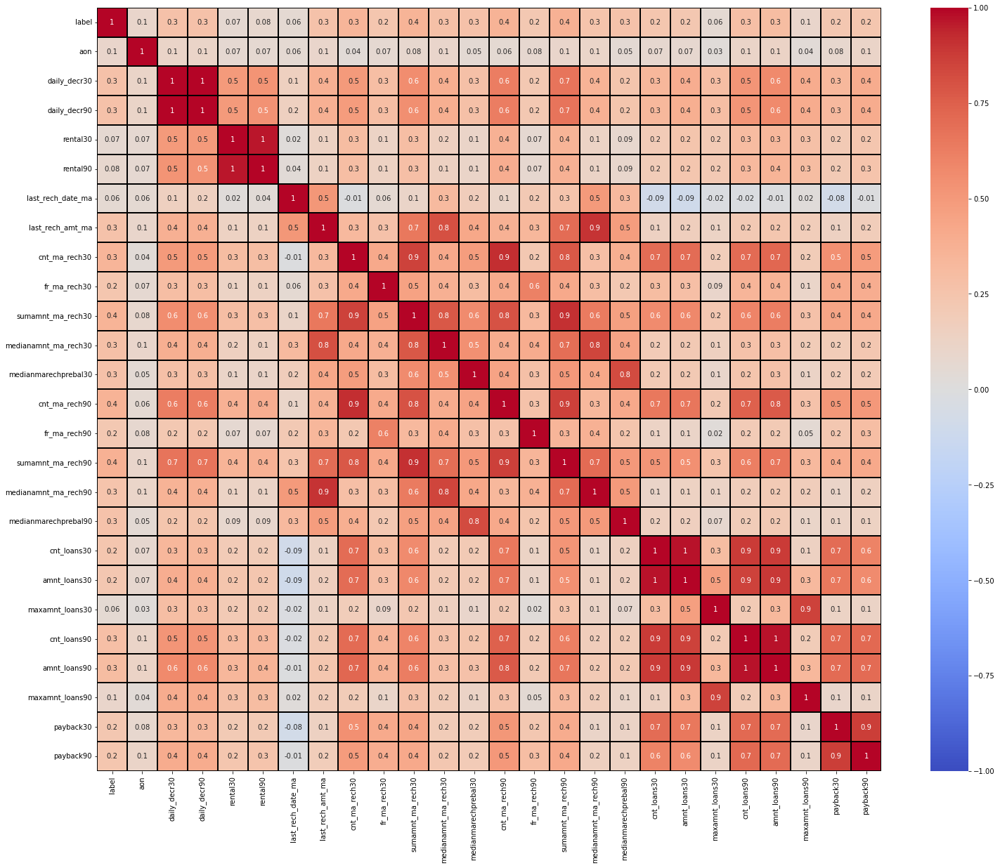

In [53]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(25,20))
sns.heatmap(df_micro.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.1g', annot = True, linecolor="black",annot_kws={'size':10},cmap="coolwarm")
plt.yticks(rotation=0);

There exist a lot of multicollinearity between 'daily_decr30' and 'daily_decr90'; 'rental30' and 'rental90' ;  'cnt_loans30' and 'amnt_loans30' ; 'cnt_loans90' and 'amnt_loans90' ; 'payback30' and 'payback90' ; . Hence we will drop either column from each group which is least correlated with the target column.

Let's visualize the correlation of all the features with target to get better insight.

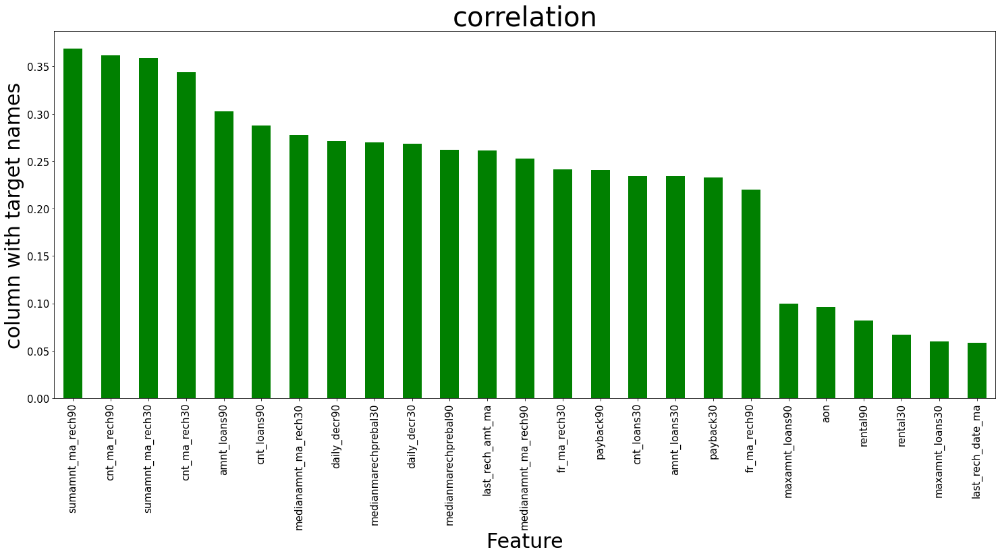

In [54]:
plt.figure(figsize=(25,10))
df_micro.corr()['label'].sort_values(ascending=False).drop(['label']).plot(kind='bar',color='g')
plt.xlabel('Feature',fontsize=30)
plt.ylabel('column with target names',fontsize=30)
plt.xticks(fontsize=15)  
plt.yticks(fontsize=15)
plt.title('correlation',fontsize=40)
plt.show()

In [55]:
df_micro.drop(['daily_decr30','rental30','cnt_ma_rech30','amnt_loans30','cnt_loans90','payback30'],axis=1,inplace=True)

<AxesSubplot:>

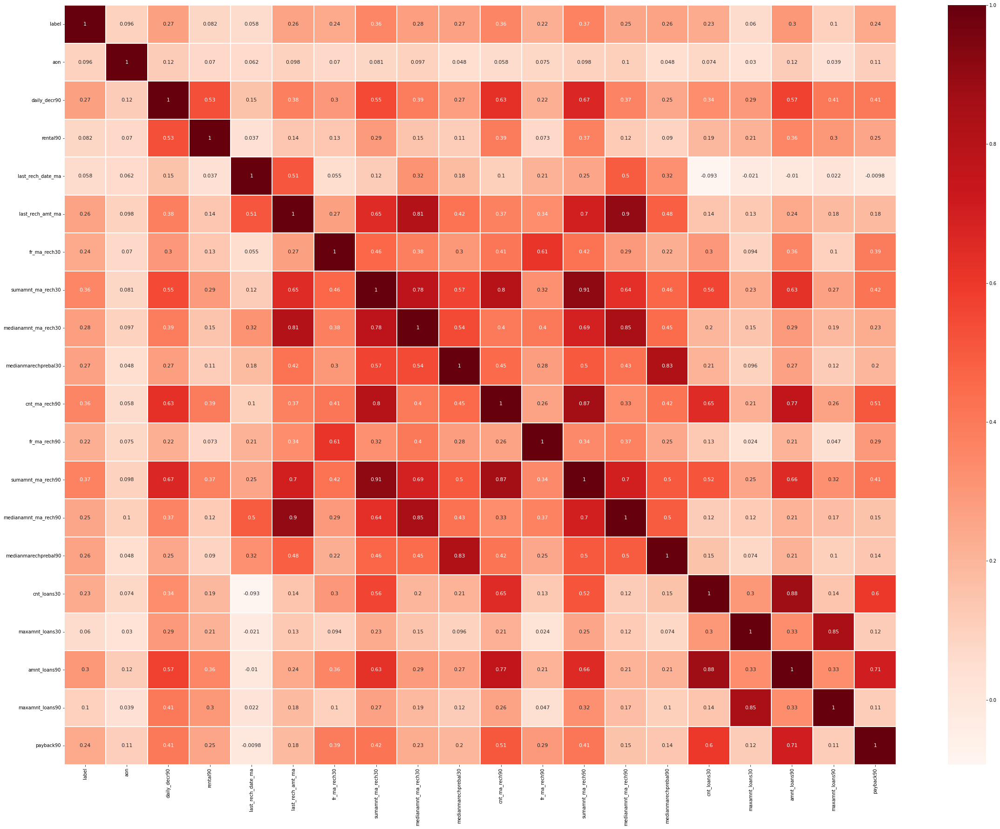

In [56]:
plt.figure(figsize=(40,30))
sns.heatmap(df_micro.corr(), linewidths=.1, cmap="Reds", annot=True, annot_kws={"size":11})

In [57]:
df_micro.shape

(209593, 20)

## Separating Features and Target:

In [58]:
x = df_micro.drop("label",axis=1)
y = df_micro["label"]

## Scaling the data using MinMax scaler:

In [59]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
X = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)

In [60]:
X.head()

,aon,daily_decr90,rental90,last_rech_date_ma,last_rech_amt_ma,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,maxamnt_loans30,amnt_loans90,maxamnt_loans90,payback90
0,0.349425,0.656818,0.435442,0.378105,0.490125,0.990908,0.435822,0.524278,0.242530,0.308332,0.869927,0.378054,0.515844,0.234134,0.602057,0.604179,0.327419,0.0,0.985619
1,0.625641,0.831458,0.574889,0.865464,0.813901,0.000000,0.541325,0.882141,0.533234,0.192214,0.000000,0.466507,0.879282,0.535654,0.416446,1.000000,0.327419,1.0,0.000000
2,0.537614,0.567298,0.470197,0.463407,0.490125,0.000000,0.342065,0.524278,0.546777,0.192214,0.000000,0.298818,0.515844,0.550194,0.416446,0.604179,0.000000,0.0,0.000000
3,0.318537,0.194465,0.428347,0.995900,0.405283,0.000000,0.000000,0.000000,0.000000,0.192214,0.000000,0.252565,0.422608,0.127341,0.602057,0.604179,0.327419,0.0,0.000000
4,0.718976,0.348442,0.479327,0.526081,0.573384,0.448839,0.822577,0.615778,0.418597,0.637207,0.390630,0.736514,0.665723,0.443432,0.924471,0.604179,0.778517,0.0,0.502196


## Balancing the target variable using SMOTE:

In [61]:
#Checking the value count of target column
y.value_counts()

1    183431
0     26162
Name: label, dtype: int64

In [62]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
X, y = SM.fit_resample(X,y)

In [63]:
# Checking the value counts again
y.value_counts()

0    183431
1    183431
Name: label, dtype: int64

<AxesSubplot:xlabel='label', ylabel='count'>

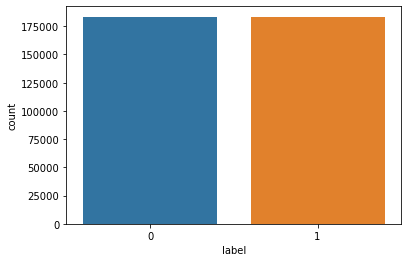

In [64]:
# Visualizing the target data after oversampling
sns.countplot(y)

Now the target data is balanced.

## Finding Best Random State and Accuracy:

In [65]:
#importing necessary libraries
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

In [66]:
from sklearn.tree import DecisionTreeClassifier
maxAccu=0
maxRS=0
for i in range(1,200):
    X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=.30, random_state =i)
    mod = DecisionTreeClassifier()
    mod.fit(X_train, y_train)
    pred = mod.predict(X_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.8904678399767397  on Random_state  32


In [67]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.30,random_state=maxRS)

## Classification Algorithms:

In [68]:
# Checking train and test data size
print(X_train.shape,'\t',X_test.shape)

(256803, 19) 	 (110059, 19)


In [69]:
print(y_train.shape,'\t',y_test.shape)

(256803,) 	 (110059,)


### 1.Logistic Regresson

The accuracy score of train is : 77.06529908139701
The accuracy score test is : 77.02686740748143
The cross validation score is : 77.06218429823082
Confusion Matrix: 
 [[42810 11942]
 [13342 41965]]
Classification 
               precision    recall  f1-score   support

           0       0.76      0.78      0.77     54752
           1       0.78      0.76      0.77     55307

    accuracy                           0.77    110059
   macro avg       0.77      0.77      0.77    110059
weighted avg       0.77      0.77      0.77    110059

***********************************************


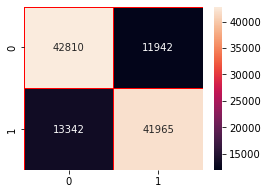

In [70]:
lr = LogisticRegression()
lr.fit(X_train, y_train)
y_pred_train = lr.predict(X_train)
y_pred = lr.predict(X_test)

print("The accuracy score of train is :", accuracy_score(y_train, y_pred_train)*100)
print("The accuracy score test is :", accuracy_score(y_test, y_pred)*100)
cv_score = cross_val_score(lr,X_train, y_train,cv=5)
print("The cross validation score is :", cv_score.mean()*100)

print("Confusion Matrix: \n", confusion_matrix(y_test, y_pred))
print("Classification \n", classification_report(y_test, y_pred))
print("***********************************************")

plt.figure(figsize=(4,3))
sns.heatmap(confusion_matrix(y_test, y_pred),annot=True,fmt = "d",linecolor="r",linewidths=1)
plt.show()

### 2. Decision Tree Classifier

The accuracy score of train is : 99.96300666269475
The accuracy score test  is : 89.03678935843502
The cross validation score is : 87.98612108621396
Confusion Matrix: 
 [[49241  5511]
 [ 6555 48752]]
Classification 
               precision    recall  f1-score   support

           0       0.88      0.90      0.89     54752
           1       0.90      0.88      0.89     55307

    accuracy                           0.89    110059
   macro avg       0.89      0.89      0.89    110059
weighted avg       0.89      0.89      0.89    110059

***********************************************


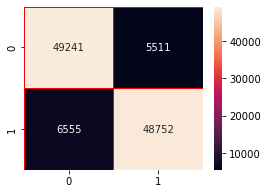

In [71]:
dtc= DecisionTreeClassifier()
dtc.fit(X_train, y_train)
y_pred_train = dtc.predict(X_train)
y_pred = dtc.predict(X_test)

print("The accuracy score of train is :", accuracy_score(y_train, y_pred_train)*100)
print("The accuracy score test  is :", accuracy_score(y_test, y_pred)*100)
cv_score = cross_val_score(dtc,X_train, y_train,cv=5)
print("The cross validation score is :", cv_score.mean()*100)

print("Confusion Matrix: \n", confusion_matrix(y_test, y_pred))
print("Classification \n", classification_report(y_test, y_pred))
print("***********************************************")

plt.figure(figsize=(4,3)) 
sns.heatmap(confusion_matrix(y_test, y_pred),annot=True,fmt = "d",linecolor="r",linewidths=1)
plt.show()

### 3. K-Neighbours Classifier

The accuracy score of train is : 91.54565951332344
The accuracy score test is : 88.17815898745218
The cross validation score is : 87.32296771293491
Confusion Matrix: 
 [[53790   962]
 [12049 43258]]
Classification                precision    recall  f1-score   support

           0       0.82      0.98      0.89     54752
           1       0.98      0.78      0.87     55307

    accuracy                           0.88    110059
   macro avg       0.90      0.88      0.88    110059
weighted avg       0.90      0.88      0.88    110059

***********************************************


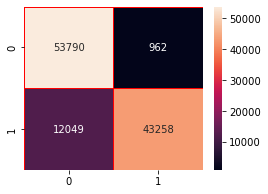

In [72]:
knc = KNeighborsClassifier()
knc.fit(X_train, y_train)
y_pred_train = knc.predict(X_train)
y_pred = knc.predict(X_test)
print("The accuracy score of train is :", accuracy_score(y_train, y_pred_train)*100)
print("The accuracy score test is :", accuracy_score(y_test, y_pred)*100)
cv_score = cross_val_score(knc,X_train, y_train,cv=5)
print("The cross validation score is :", cv_score.mean()*100)

print("Confusion Matrix: \n", confusion_matrix(y_test, y_pred))
print("Classification ", classification_report(y_test, y_pred))
print("***********************************************")
from sklearn.neighbors import KNeighborsClassifier
plt.figure(figsize=(4,3))
sns.heatmap(confusion_matrix(y_test, y_pred),annot=True,fmt = "d",linecolor="r",linewidths=1)
plt.show()

### 4. GaussianNB

The accuracy score of train is : 75.66578272060684
The accuracy score test is : 75.92654848762936
The cross validation score is : 75.65448985620749
Confusion Matrix: 
 [[40959 13793]
 [12702 42605]]
Classification                precision    recall  f1-score   support

           0       0.76      0.75      0.76     54752
           1       0.76      0.77      0.76     55307

    accuracy                           0.76    110059
   macro avg       0.76      0.76      0.76    110059
weighted avg       0.76      0.76      0.76    110059

***********************************************


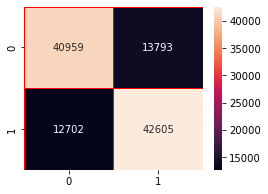

In [73]:
gnb = GaussianNB()
gnb.fit(X_train, y_train)
y_pred_train = gnb.predict(X_train)
y_pred = gnb.predict(X_test)
print("The accuracy score of train is :", accuracy_score(y_train, y_pred_train)*100)
print("The accuracy score test is :", accuracy_score(y_test, y_pred)*100)
cv_score = cross_val_score(gnb,X_train, y_train,cv=5)
print("The cross validation score is :", cv_score.mean()*100)

print("Confusion Matrix: \n", confusion_matrix(y_test, y_pred))
print("Classification ", classification_report(y_test, y_pred))
print("***********************************************")

plt.figure(figsize=(4,3))
sns.heatmap(confusion_matrix(y_test, y_pred),annot=True,fmt = "d",linecolor="r",linewidths=1)
plt.show()

### 5. Random Forest Classifier

In [3]:
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)
y_pred_train = rfc.predict(X_train)
y_pred = rfc.predict(X_test)

print("The accuracy score of train is :", accuracy_score(y_train, y_pred_train)*100)
print("The accuracy score test is :", accuracy_score(y_test, y_pred)*100)
cv_score = cross_val_score(rfc,X_train, y_train,cv=5)
print("The cross validation score is :", cv_score.mean()*100)

print("Confusion Matrix: \n", confusion_matrix(y_test, y_pred))
print("Classification\n ", classification_report(y_test, y_pred))
print("***********************************************")

plt.figure(figsize=(4,3))
sns.heatmap(confusion_matrix(y_test, y_pred),annot=True,fmt = "d",linecolor="r",linewidths=1)

plt.show()

NameError: name 'X_train' is not defined

### 6. AdaBoostClassifier

In [ ]:
# Checking accuracy for AdaBoostClassifier
from sklearn.ensemble import AdaBoostClassifier
adc=AdaBoostClassifier(n_estimators=100,random_state=102,base_estimator=DecisionTreeClassifier(),algorithm='SAMME',learning_rate=0.01)
adc.fit(X_train, y_train)
y_pred_train = adc.predict(X_train)
y_pred = adc.predict(X_test)

print("The accuracy score of train is :", accuracy_score(y_train, y_pred_train)*100)
print("The accuracy score test is :", accuracy_score(y_test, y_pred)*100)
cv_score = cross_val_score(adc,X_train, y_train,cv=5)
print("The cross validation score is :", cv_score.mean()*100)

print("Confusion Matrix: \n", confusion_matrix(y_test, y_pred))
print("Classification\n ", classification_report(y_test, y_pred))
print("***********************************************")

plt.figure(figsize=(4,3))
sns.heatmap(confusion_matrix(y_test, y_pred),annot=True,fmt = "d",linecolor="r",linewidths=1)

plt.show()

### Observation:

We have trained several models above for the dataset we had prepared and we got different results for different alogorithm,

1. Logistic regression model gave us train score of 77.1%  and test score of 76.9% of accuracy and cross validation score of 77.1 % for the test model which is very near and also the precission, accuracy score are also high.

2. DecisionTreeClassifier model gave us train score of 99.9%  and test score of 89% of accuracy and cross validation score of 87.9 % for the test model. Here the model is overfitting as there is large difference between train score and test score. 

3. KNN classifier has given us 91.5% and 88% of accuracy and cv score of 87.5% for the test dataset. 

4. GaussianNB() model gave us train score of 75.7%  and test score of 75.6% of accuracy and cross validation score of 75.7 % for the test model. Here the model accuracy is low as compared to other models.. 

5. Random Forest classifier model gave us train score of 99.9%  and test score of 94.1% of accuracy and cross validation score of 93.6% and also metric values are near to 1 which is very good score. 

6. AdaBoostClassifier model gave us train score of 99.9%  and test score of 89.3% of accuracy and cross validation score of 93.6% .Here the model is overfitting as there is large difference between train score and test score. 
 

## Hyperparameter Optimization:

All of the above models have given us the good results for the model prepared, let us check if we can improvise our model performance to 100% accuracy.

**We are selecting random forest classifier model to increase the accuracy using Gridsearch CV method as it is giving the highest accuracy with least train and test score difference**

In [92]:
parameters = {"n_estimators":[8,4,6],  
              "min_samples_leaf":[2,3,4,5,],
              "criterion":["gini","entropy"], 
              "min_samples_split":[2,4,6,8,10]}

rfc = GridSearchCV(RandomForestClassifier(), parameters)
#fitting train and test data
rfc.fit(X_train,y_train) 
  
#Best parameters
rfc.best_params_

{'criterion': 'entropy',
 'min_samples_leaf': 2,
 'min_samples_split': 4,
 'n_estimators': 8}

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 8


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


building tree 2 of 8
building tree 3 of 8
building tree 4 of 8
building tree 5 of 8
building tree 6 of 8
building tree 7 of 8
building tree 8 of 8


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    5.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s finished


The accuracy score of train is : 98.0027491890671
The accuracy score test is : 92.49493453511299
building tree 1 of 8


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


building tree 2 of 8
building tree 3 of 8
building tree 4 of 8
building tree 5 of 8
building tree 6 of 8
building tree 7 of 8
building tree 8 of 8


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    4.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 8


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


building tree 2 of 8
building tree 3 of 8
building tree 4 of 8
building tree 5 of 8
building tree 6 of 8
building tree 7 of 8
building tree 8 of 8


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    4.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 8


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


building tree 2 of 8
building tree 3 of 8
building tree 4 of 8
building tree 5 of 8
building tree 6 of 8
building tree 7 of 8
building tree 8 of 8


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    4.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 8


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


building tree 2 of 8
building tree 3 of 8
building tree 4 of 8
building tree 5 of 8
building tree 6 of 8
building tree 7 of 8
building tree 8 of 8


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    4.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 8


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


building tree 2 of 8
building tree 3 of 8
building tree 4 of 8
building tree 5 of 8
building tree 6 of 8
building tree 7 of 8
building tree 8 of 8


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    4.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.0s finished


The cross validation score is : 92.00048255033806
Confusion Matrix: 
 [[51243  3761]
 [ 4499 50556]]
Classification
                precision    recall  f1-score   support

           0       0.92      0.93      0.93     55004
           1       0.93      0.92      0.92     55055

    accuracy                           0.92    110059
   macro avg       0.93      0.92      0.92    110059
weighted avg       0.93      0.92      0.92    110059

***********************************************


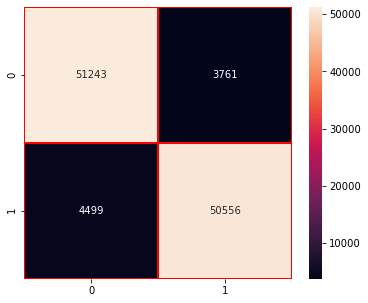

In [93]:
rfc = RandomForestClassifier(criterion='entropy',min_samples_leaf=2, min_samples_split=4,n_estimators=8,n_jobs=1,verbose=2)
rfc.fit(X_train, y_train)
y_pred_train = rfc.predict(X_train)
y_pred = rfc.predict(X_test)
print("The accuracy score of train is :", accuracy_score(y_train, y_pred_train)*100)
print("The accuracy score test is :", accuracy_score(y_test, y_pred)*100)
cv_score = cross_val_score(rfc,X_train, y_train,cv=5)
print("The cross validation score is :", cv_score.mean()*100)

print("Confusion Matrix: \n", confusion_matrix(y_test, y_pred))
print("Classification\n ", classification_report(y_test, y_pred))
print("***********************************************")

plt.figure(figsize=(6,5))
sns.heatmap(confusion_matrix(y_test, y_pred),annot=True,fmt = "d",linecolor="r",linewidths=1)

plt.show()

**We see that even after hyperparameter optimization, there is no much changes in the accuracy score, Hence saving the previous model for the reference.**

Let us plot the Area Under Curve graph to find the best model which fits highest area in curve.

In [95]:
# Plotting ROC for all the models used here
from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.1s finished


<Figure size 1080x1080 with 0 Axes>

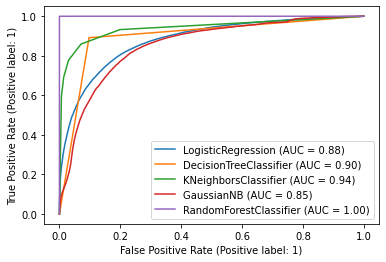

In [96]:
plt.figure(figsize=(15,15,))
graph = plot_roc_curve(lr,X_test, y_pred)  
plot_roc_curve(dtc,X_test, y_pred, ax=graph.ax_)
plot_roc_curve(knc,X_test, y_pred, ax=graph.ax_)
plot_roc_curve(gnb,X_test, y_pred, ax=graph.ax_)
plot_roc_curve(rfc,X_test, y_pred, ax=graph.ax_)  
plt.show()


# Saving the best Model

We see that Random forest classifier model has given the highest AUC in graph, the accuracy score of 97% and CV score of 96% which is highest among all the models tested. also we see that evaluation metrics are high for this model. Hence we will be saving this model.

In [97]:
import joblib
file = "MicroCredit_Defaulter_Project.joblib"
joblib.dump(rfc,file)

['MicroCredit_Defaulter_Project.joblib']